## Observations

In [1]:
using LinearAlgebra
using Plots

In [2]:
include("../rollout.jl")
include("../testfns.jl")

ConstantTestFunction (generic function with 2 methods)

In [3]:
function sample_random_matrix(xmin, xmax, d, n)
    matrix = zeros(d, n)
    for i in 1:d
        for j in 1:n
            matrix[i, j] = xmin + (xmax - xmin) * rand()
        end
    end
    return matrix
end

sample_random_matrix (generic function with 1 method)

In [4]:
BUDGET = 1

1

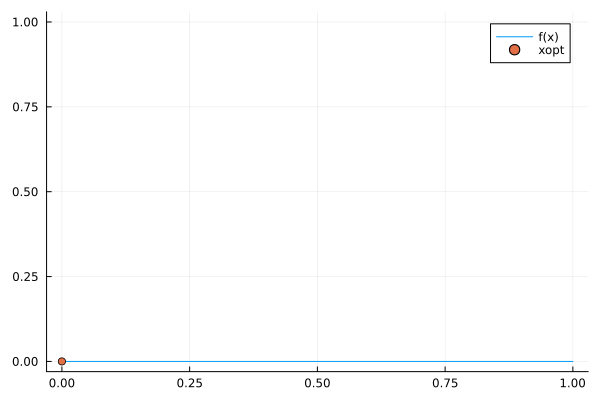

In [5]:
testfn = ConstantTestFunction(0., lbs=[0.], ubs=[1.])
tplot(testfn)

In [31]:
n, h, σn2 = 1, 5, 1e-10
MC_SAMPLES = 10000
# Setup low discrepancy random number stream
lds_rns = gen_low_discrepancy_sequence(MC_SAMPLES, testfn.dim, h+1);
rns = randn(MC_SAMPLES, testfn.dim+1, h+1);

MAX_BUDGET, MAX_TRIALS = 25, 1
xmin, xmax, d = (testfn.bounds[1], testfn.bounds[2], size(testfn.bounds, 1))
θ = [.25]
ψ = kernel_scale(
    kernel_matern52,
    [5., θ...]
)

lbs, ubs = [xmin], [xmax]
ϵ, num_starts = 1e-6, 64
s = SobolSeq(lbs, ubs)

xstarts = reduce(hcat, next!(s) for i = 1:num_starts)
xstarts = hcat(xstarts, lbs .+ ϵ)
xstarts = hcat(xstarts, ubs .- ϵ);

## Inquiry
I believe the generated normally distributed samples lose their space filling property after we transform the Sobol sequence of uniform variables to be multivariate normal.

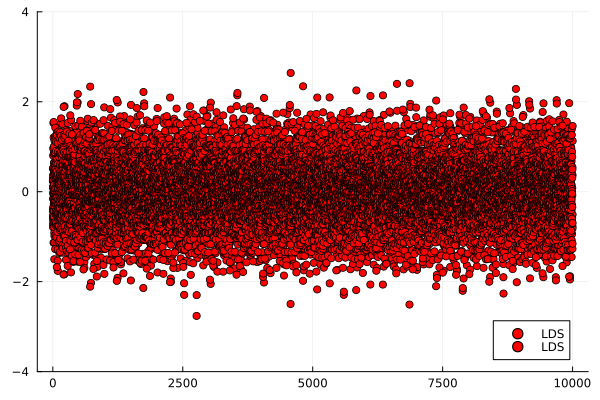

In [37]:
col_ndx = 2
scatter(lds_rns[:,:,col_ndx], color=:red, label="LDS", ylims=((-4, 4.)))

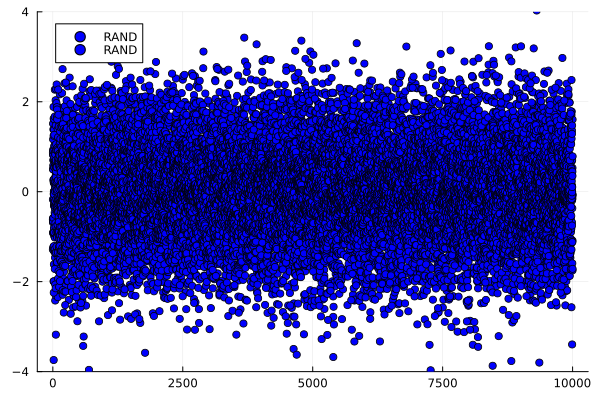

In [38]:
scatter(rns[:,:,col_ndx], color=:blue, label="RAND", ylims=(-4, 4))

In [18]:
rns[:,:,1]

100×2 Matrix{Float64}:
 -0.310854     0.284708
  0.00391443  -1.029
 -0.484267    -0.761334
  0.288454    -1.36475
  1.39304      2.01472
 -0.380695     1.16365
  0.398077    -0.175704
 -0.678503    -0.43209
  0.672782     0.127111
  0.823932    -0.479991
 -0.136455     1.24743
  0.0741504    0.0544279
 -2.48864     -1.17503
  ⋮           
  1.24262     -1.06611
 -1.50066     -0.155458
  1.14861      0.147314
  0.313257    -0.861514
  1.61493     -2.19898
  0.82657     -0.242319
 -2.15729      0.46548
  0.381086    -1.0146
 -0.919291     2.26503
  0.384815     0.394174
 -0.676309     0.496286
 -0.320503    -0.348909